# Expriment 2: Delay the feature learning

This experiment will try to delay the onset of the feature learning. This will give the guassians a chance to first start to form a picture before the features are lifted. This will use the original `ContrastiveManager` and scene `Apartment_release_work_skeleton_seq131`.

In [1]:
import os

# Set environment variables for training script
SCENE_NAME='Apartment_release_work_skeleton_seq131'
ADT_PROCESSED_ROOT='/home/ubuntu/cs-747-project/adt_processed'
OUT_PATH='/home/ubuntu/cs-747-project/output/adt'
FOLDER_NAME='unc_2d_unet_egolifter_contrast_v2'

os.environ.update({
    "SCENE_NAME":         SCENE_NAME,
    "ADT_PROCESSED_ROOT": ADT_PROCESSED_ROOT,
    "OUT_PATH":           OUT_PATH,
    "FOLDER_NAME":        FOLDER_NAME,
})

In [5]:
# Run the training script. Start the feature lift after 5000 iterations.
!uv run python ../train_lightning.py \
	scene.scene_name={SCENE_NAME} \
    scene.data_root={ADT_PROCESSED_ROOT} \
    model=unc_2d_unet \
    model.unet_acti=sigmoid \
    model.dim_extra=16 \
    lift.use_contr=True \
    lift.name=default \
    lift.lift_delay_n_steps=5000 \
    exp_name=exp3_egolifter_delay \
    output_root={OUT_PATH} \
    wandb.project=egolifter_adt

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'train': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
Working directory : /home/ubuntu/egolifter/experiments
Output directory  : /home/ubuntu/cs-747-project/output/adt/Apartment_release_work_skeleton_seq131/unc_2d_unet_exp3_egolifter_delay/2025-05-04_05-16-39
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: jackdaus (jackdaus-george-mason-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.19.9
wandb: Run data is saved locally in /home/ubuntu/cs-747-project/output/adt/Apartment_release_work_skeleton_seq131/unc_2d_unet_exp3_egolifter_delay/wandb/run-20250504_051640-6m2f188q
wandb: Run `wandb offli

# View results

In [ ]:
# Select one of the output folder from below
os.environ.update({
    "FOLDER_NAME": "unc_2d_unet_egolifter_contrast_v2",
})

!echo "Running with folder name: {OUT_PATH}/{SCENE_NAME}/{FOLDER_NAME}"

# This will start a local server 
# open the browser and go to the link for visualization
!uv run python ../viewer.py \
    {OUT_PATH}/{SCENE_NAME}/{FOLDER_NAME} \
    --data_root {ADT_PROCESSED_ROOT}  \
    --reorient disable \
    --feat_pca

# Load the model and explore learned features

In [7]:
import sys, os
sys.path.append(os.path.join(os.path.dirname(os.getcwd())))

from utils.routines import load_from_model_path

model_path = f'{OUT_PATH}/{SCENE_NAME}/{FOLDER_NAME}'
source_path= f'{ADT_PROCESSED_ROOT}/{SCENE_NAME}'

model, scene, cfg = load_from_model_path(
    model_path,
    source_path
)

Overriding source_path to /home/ubuntu/cs-747-project/adt_processed/Apartment_release_work_skeleton_seq131
Found global_points.csv.gz file, assuming Aria data set!
Using cameras: {'rgb'}
Loaded #3dPoints: 840220
Loading the semantic segmentation info
Loading the 2D segmentation info
Found 1852 images for train subset.
Found 464 images for valid subset.
Found 290 images for valid_novel subset.
Found 289 images for test subset.
Found 2316 images for trainvalid subset.
Found 579 images for novel subset.
Found 2605 images for all subset.
Initializing U-Net...
Loading checkpoint from /home/ubuntu/cs-747-project/output/adt/Apartment_release_work_skeleton_seq131/unc_2d_unet_egolifter_contrast_v2/chkpntstep=30000.ckpt


/home/ubuntu/egolifter/utils/system_utils.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path, map_location="cpu")


           Feature_0      Feature_1      Feature_2      Feature_3  \
count  100451.000000  100451.000000  100451.000000  100451.000000   
mean       -0.002940      -0.039427      -0.146676      -0.021176   
std         1.008603       0.990034       0.989692       0.992679   
min       -10.778452      -6.371269      -9.667392      -5.849363   
25%        -0.630113      -0.642047      -0.720795      -0.618007   
50%        -0.019531      -0.054335      -0.222054      -0.034796   
75%         0.605540       0.548966       0.416103       0.576920   
max        11.748994       8.469905       8.995086      11.474579   

           Feature_4      Feature_5      Feature_6      Feature_7  \
count  100451.000000  100451.000000  100451.000000  100451.000000   
mean        0.068935       0.075452      -0.144989       0.071448   
std         0.995858       1.003588       0.980362       1.000218   
min        -9.075850      -8.743915      -7.523377     -10.719817   
25%        -0.524055      -0.5327

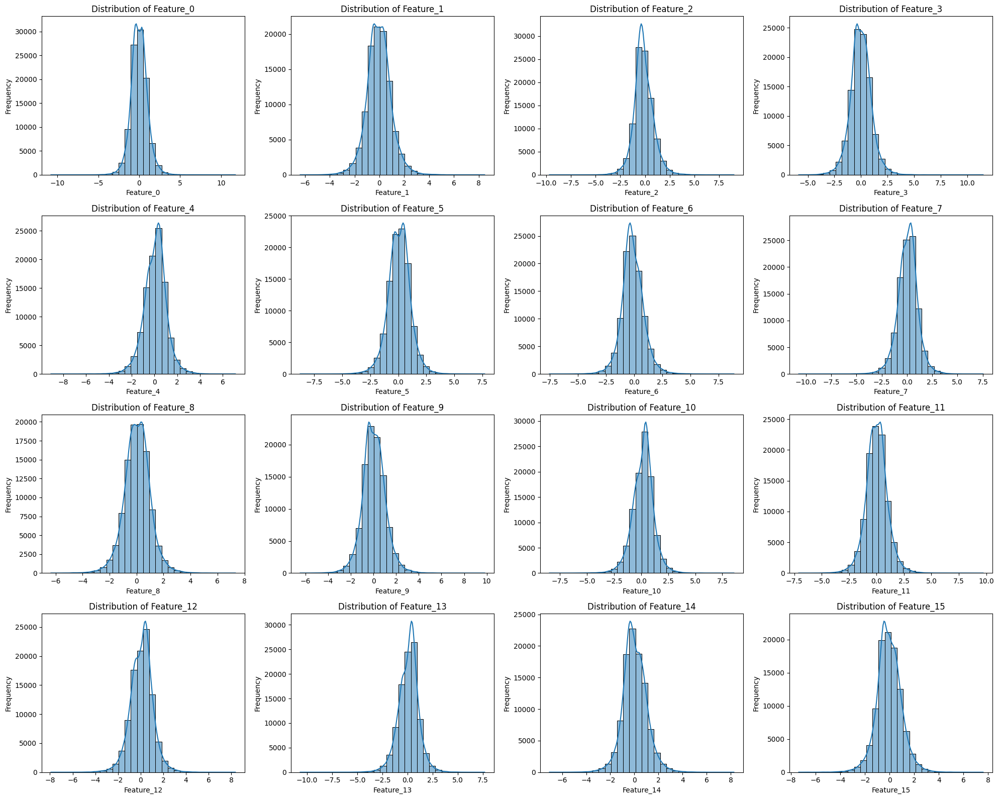

In [8]:
# Print data statistics summary using pandas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Load the data
data = model.gaussians.get_features_extra.detach().cpu().numpy()
# Convert to DataFrame
df = pd.DataFrame(data, columns=[f'Feature_{i}' for i in range(data.shape[1])])
# Print the first few rows
# print(df.head())
# Print the summary statistics
print(df.describe())
# Plot the distribution of each feature in a grid
num_features = len(df.columns)
num_cols = 4  # Number of columns in the grid
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate required rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows))
axes = axes.flatten()

for i, column in enumerate(df.columns):
    sns.histplot(df[column], bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

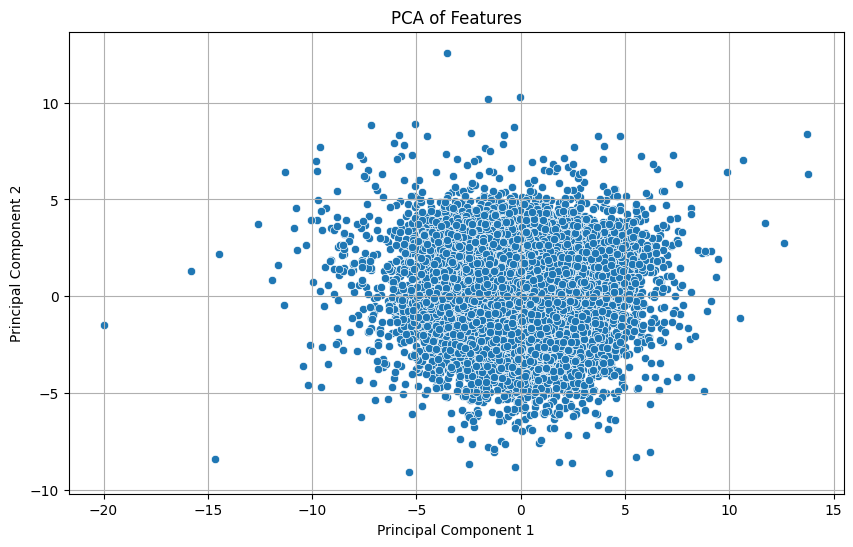

In [10]:
# Perform PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Load the data
data = model.gaussians.get_features_extra.detach().cpu().numpy()
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
# Perform PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)
# Create a DataFrame for the PCA results
df_pca = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])
# Plot the PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', data=df_pca)
plt.title('PCA of Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

# T-SNE

## T-SNE 2D

In [11]:
# We need the data to be standardized
data_standardized = StandardScaler().fit_transform(data)

In [12]:
from sklearn.neighbors import NearestNeighbors

# Calculate the neighborhoods in the embedding space
data_standardized = StandardScaler().fit_transform(data)
knn = NearestNeighbors(n_neighbors=15, metric="cosine").fit(data_standardized)
knn_graph = knn.kneighbors_graph(mode="distance")     # sparse matrix

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


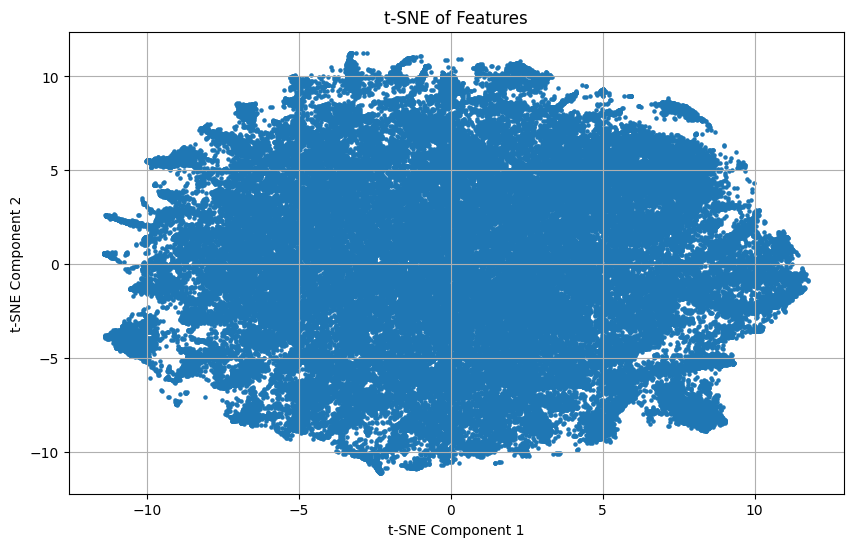

In [13]:
# Calculate tsne
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300, random_state=42)
X_tsne = tsne.fit_transform(data_standardized)
# Plot the t-SNE results
plt.figure(figsize=(10, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], s=5)
plt.title('t-SNE of Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.grid()
plt.show()

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


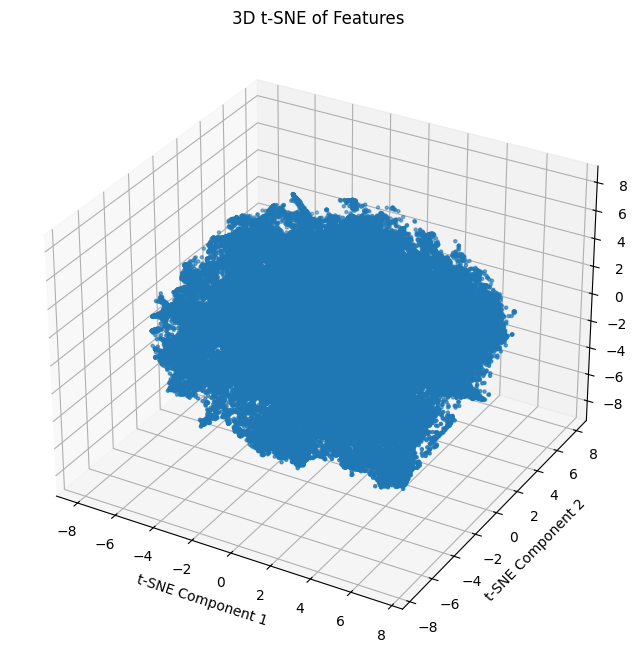

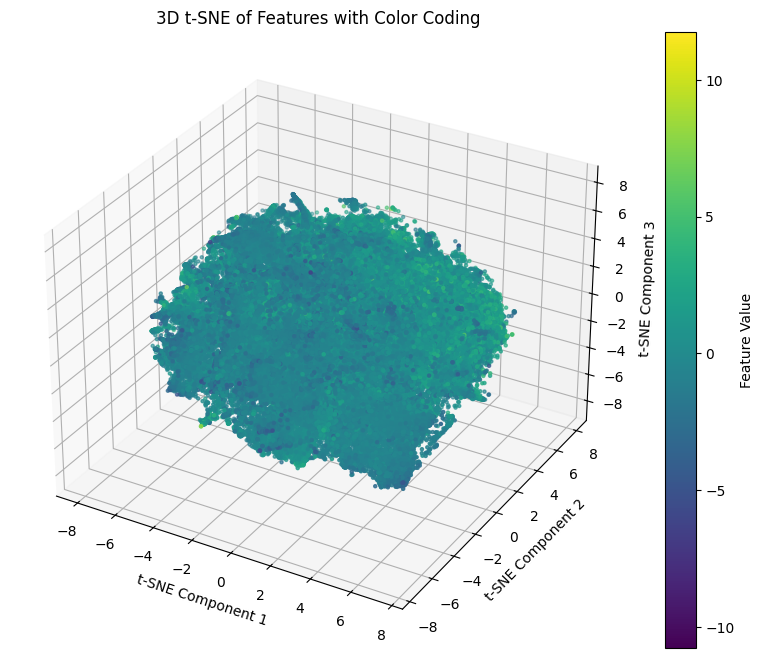

In [14]:
# 3D t-SNE
# from mpl_toolkits.mplot3d import Ax
# import Axes3D
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Load the data
data = model.gaussians.get_features_extra.detach().cpu().numpy()
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Perform t-SNE
tsne = TSNE(n_components=3, perplexity=30, n_iter=300, random_state=42)
X_tsne = tsne.fit_transform(data_scaled)

# Plot the t-SNE results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], s=5)
ax.set_title('3D t-SNE of Features')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
plt.show()

# Plot the t-SNE results in 3D with color coding
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c=data[:, 0], cmap='viridis', s=5)
ax.set_title('3D t-SNE of Features with Color Coding')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
plt.colorbar(ax.collections[0], ax=ax, label='Feature Value')
plt.show()

# Create an interactive 3D plot using Plotly



## T-SNE 3D

In [ ]:
import plotly.express as px

# Create an interactive 3D scatter plot with Plotly
fig = px.scatter_3d(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    z=X_tsne[:, 2],
    color=data[:, 0],  # Adjust the feature for color-coding as needed
    labels={'x': 'TSNE Component 1', 
            'y': 'TSNE Component 2', 
            'z': 'TSNE Component 3'},
    title='Interactive 3D t-SNE Plot of Features',
    # Smaller point size
    size_max=0.01,
    
)
fig.update_traces(marker=dict(size=1))
fig.update_layout(height=800)
fig.show()

# UMAP

Another way to vizualize the groupings.

In [17]:
import umap

umap2d = umap.UMAP(
    n_neighbors=15,        # matches knn above
    min_dist=0.1,          # 0 → tighter clusters, >0.4 → looser
    metric="cosine"
).fit_transform(data_standardized)

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [18]:
import hdbscan
# Cluster the data using HDBSCAN. Ideally, we'd use ground truth labels for our UMAP. But we don't have time to calculate those. 
# With more time, we use the ARIA dataset to map our 3dgs points to ground truth labels. 
labels = hdbscan.HDBSCAN(min_cluster_size=20, metric="euclidean").fit_predict(umap2d)

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [19]:
import plotly.express as px
fig = px.scatter(x=umap2d[:,0], y=umap2d[:,1],
                 color=labels.astype(str),
                 hover_data=dict(index=list(range(len(data)))),
                 )
fig.show()